## Diabetes Predictor

Life Cycle of ML Project
- Problem Statement
- Data Collection
- Data Check
- EDA
- Data Pre-Processing
- Model Training
- Best Model

1) Problem Statement
- This project aims to create a program that a user can use to give them a prediction on whether or not they have diabetes.

2) Data Collection
- Dataset Source - https://www.kaggle.com/datasets/iammustafatz/diabetes-prediction-dataset
- Dataset has 9 columns and 100000 rows

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import plotly.express as px
import nbformat
%matplotlib inline

In [14]:
df = pd.read_csv('Data/diabetes_prediction_dataset.csv')

In [17]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   gender               100000 non-null  object 
 1   age                  100000 non-null  float64
 2   hypertension         100000 non-null  int64  
 3   heart_disease        100000 non-null  int64  
 4   smoking_history      100000 non-null  object 
 5   bmi                  100000 non-null  float64
 6   HbA1c_level          100000 non-null  float64
 7   blood_glucose_level  100000 non-null  int64  
 8   diabetes             100000 non-null  int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 6.9+ MB


2.2 Information
- gender: Sex of individuals -> Male/Female/Other
- age: age of the individual
- Hypertension: Whether or not the person has hypertension
- Smoking History: Never, No info, Current, Former, Ever, Not Current
- bmi: The Body Mass Index of the individual
- HbA1C Levels: The individuals HbA1c Levels
- Blood Glucos Level
- Diabetes: Are they diabetic

In [19]:
df.isna().sum()

gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64

In [20]:
df.drop_duplicates(inplace = True)
print('Number of Duplicates: {:,}'.format(df.duplicated().sum()))


Number of Duplicates: 0


gender
Female    56161
Male      39967
Other        18
Name: count, dtype: int64

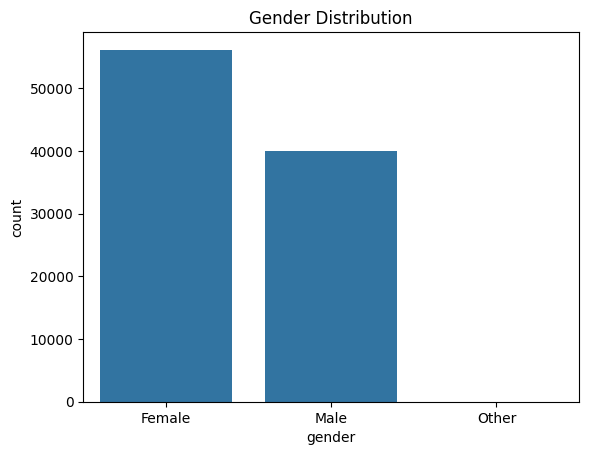

In [21]:
sns.countplot(data=df, x='gender')
plt.title('Gender Distribution')
df['gender'].value_counts()


smoking_history
never          34395
No Info        32881
former          9299
current         9197
not current     6359
ever            3997
Name: count, dtype: int64

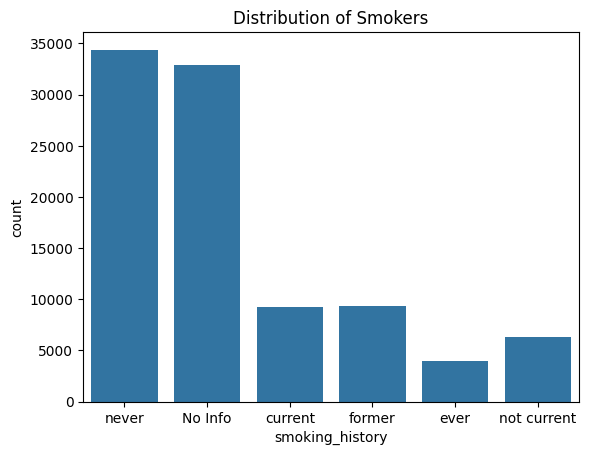

In [31]:
sns.countplot(data=df, x='smoking_history')
plt.title('Distribution of Smokers')
df['smoking_history'].value_counts()

In [22]:
df = df[~(df['gender']=='Other')]

In [23]:
dfcopy = df.loc[df['diabetes'].isin([1])]

dfcopy.head()


,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
6,Female,44.0,0,0,never,19.31,6.5,200,1
26,Male,67.0,0,1,not current,27.32,6.5,200,1
38,Male,50.0,1,0,current,27.32,5.7,260,1
40,Male,73.0,0,0,former,25.91,9.0,160,1
53,Female,53.0,0,0,former,27.32,7.0,159,1


In [24]:
# Define conditions based on gender and diabetes status
conditions = [
    (df['gender'] == 'Male') & (df['diabetes'] == 0),
    (df['gender'] == 'Male') & (df['diabetes'] == 1),
    (df['gender'] == 'Female') & (df['diabetes'] == 0),
    (df['gender'] == 'Female') & (df['diabetes'] == 1)
]

# Define corresponding choices for each condition
choices = [
    'Male | Normal',
    'Male | Diabetic',
    'Female | Normal',
    'Female | Diabetic'
]

# Apply conditions and choices to create the 'category' column
df['category'] = np.select(conditions, choices, default = 'Unknown')

C:\Users\ryan_\AppData\Local\Temp\ipykernel_39956\2739919064.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['category'] = np.select(conditions, choices, default = 'Unknown')


In [28]:
#Goal: create a plot that shows the correlation between diabetes and age
fig_age = px.box(
    df,
    x = 'diabetes',
    y = 'age',
    title = "Diabetes and Age",
    labels = {'diabetes': 'Condition', 'age': 'Age'},
    color='gender')
fig_age.update_layout(title_x = 0.5, legend_title = '')
fig_age.update_xaxes(tickvals = [0, 1], ticktext = ['Normal', 'Diabetic'])




c:\Users\ryan_\OneDrive\Desktop\Diabetes\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'hovertemplate': 'gender=Female<br>Condition=%{x}<br>Age=%{y}<extra></extra>',
              'legendgroup': 'Female',
              'marker': {'color': '#636efa'},
              'name': 'Female',
              'notched': False,
              'offsetgroup': 'Female',
              'orientation': 'v',
              'showlegend': True,
              'type': 'box',
              'x': array([0, 0, 0, ..., 0, 0, 0], dtype=int64),
              'x0': ' ',
              'xaxis': 'x',
              'y': array([80., 54., 36., ...,  2., 24., 57.]),
              'y0': ' ',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'hovertemplate': 'gender=Male<br>Condition=%{x}<br>Age=%{y}<extra></extra>',
              'legendgroup': 'Male',
              'marker': {'color': '#EF553B'},
              'name': 'Male',
              'notched': False,
              'offsetgroup': 'Male',
              'orientation': 'v',
              'showlegend': True,
              'type': 'box',
              'x': array([0, 0, 0, ..., 0, 0, 0], dtype=int64),
              'x0': ' ',
              'xaxis': 'x',
              'y': array([28., 76., 42., ..., 19., 22., 66.]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'title': {'text': ''}, 'tracegroupgap': 0},
               'template': '...',
               'title': {'text': 'Diabetes and Age', 'x': 0.5},
               'xaxis': {'anchor': 'y',
                         'domain': [0.0, 1.0],
                         'ticktext': [Normal, Diabetic],
                         'tickvals': [0, 1],
                         'title': {'text': 'Condition'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'Age'}}}
})

As shown with through the plots above, the chance of having diabetes increases as one ages. Also in this case there is not much difference between males and females. The chance of having diabetes later in life is the same in both.

In [29]:
import plotly.graph_objects as go

In [30]:

fig_bmi_age = px.histogram(
    df,
    y= 'bmi',
    x='age',
    title = "BMI and Age",
    histfunc='avg',
    barmode='overlay',
    color = 'category',
    color_discrete_map = {
        'Male | Normal': 'blue', 
        'Male | Diabetic': 'orange',
        'Female | Normal': 'lightgreen', 
        'Female | Diabetic': 'darkred'},
)

fig_bmi_age.show()

c:\Users\ryan_\OneDrive\Desktop\Diabetes\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

In [14]:
#Goal: Show if there is any correlation between smoking and diabetes
# Show how many individuals have both heartdisease and diabetes and how many only have one or the other

In [15]:
df['smoking_history'].value_counts()

smoking_history
never          34395
No Info        32881
former          9299
current         9197
not current     6359
ever            3997
Name: count, dtype: int64

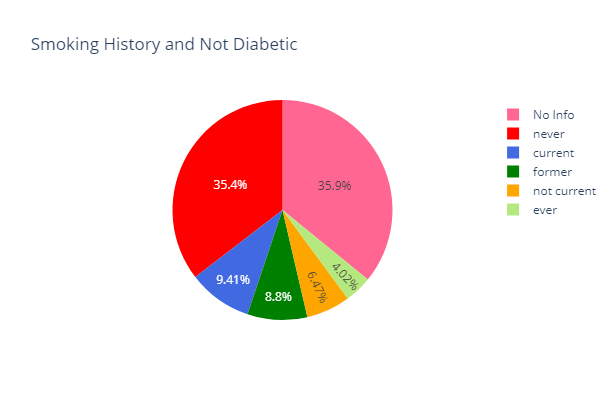

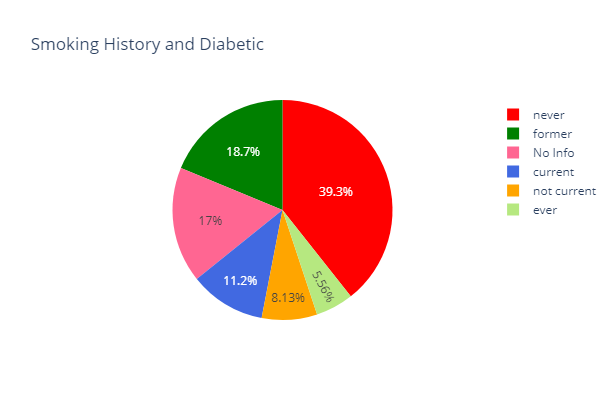

In [16]:
df1 = df[df['diabetes'] == 0]
df2 = df[df['diabetes']==1]


fig = px.pie(df1, names='smoking_history', color = 'smoking_history', color_discrete_map={'No info':'gray',
                                 'never':'red',
                                 'current':'royalblue',
                                 'former':'green',
                                 'not current' : 'orange',
                                 ' ever' : 'lightblue'},
             title='Smoking History and Not Diabetic')
fig1 = px.pie(df2, names='smoking_history', color = 'smoking_history', color_discrete_map={'No info':'gray',
                                 'never':'red',
                                 'current':'royalblue',
                                 'former':'green',
                                 'not current' : 'orange',
                                 ' ever' : 'lightblue'},
              title ='Smoking History and Diabetic')
fig.update_layout(height=400, width=600, showlegend=True)
fig.show()
fig1.update_layout(height= 400, width=600, showlegend=True)
fig1.show()


From the piecharts above, it can be seen that there seems to be a slight increase in the number of smokers when looking at diabetics as compared with non-diabetics.

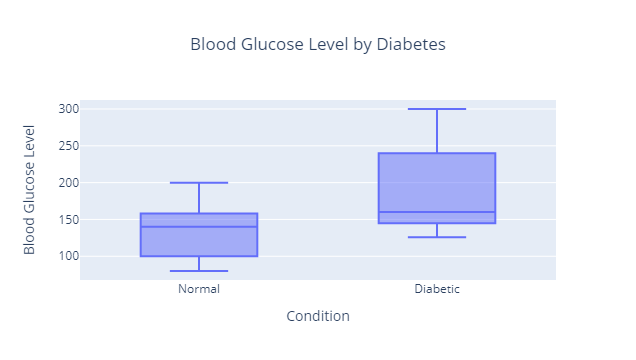

In [17]:
#diabetes and blood glucose 

fig_blood_glu = px.box(
    df, 
    x = 'diabetes',
    y = 'blood_glucose_level',
    title = 'Blood Glucose Level by Diabetes',
    labels = {'diabetes': 'Condition', 'blood_glucose_level': 'Blood Glucose Level'})
fig_blood_glu.update_layout(title_x = 0.5, legend_title = '')

fig_blood_glu.update_xaxes(tickvals = [0, 1], ticktext = ['Normal', 'Diabetic'])

fig_blood_glu.show()

C:\Users\ryan_\.conda\envs\Streamlit\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



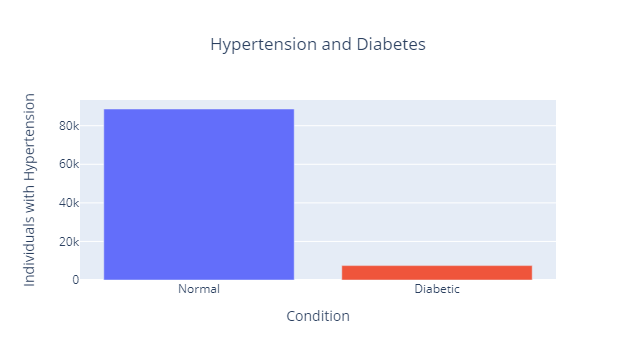

diabetes
0    87646
1     8482
Name: count, dtype: int64

In [18]:
hypertens_counts = df.groupby(['hypertension'], as_index = False)['diabetes'].count()

fig_hyper = px.bar( 
    hypertens_counts,
    x = hypertens_counts['hypertension'].values,
    y = hypertens_counts['diabetes'].values,
    title = 'Hypertension and Diabetes',
    labels={'x':'Condition', 'y':'Individuals with Hypertension'},
    color =["blue", "red"])

fig_hyper.update_layout(title_x = 0.5)

fig_hyper.update_xaxes(tickvals = [0, 1], ticktext = ['Normal', 'Diabetic'])

fig_hyper.layout.showlegend = False

fig_hyper.show()

df['diabetes'].value_counts()

C:\Users\ryan_\.conda\envs\Streamlit\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



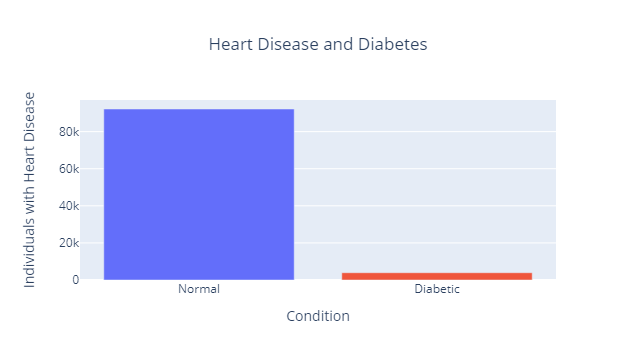

In [19]:
heart_counts = df.groupby(['heart_disease'], as_index = False)['diabetes'].count()

fig_heart = px.bar( 
    heart_counts,
    x = heart_counts['heart_disease'].values,
    y = heart_counts['diabetes'].values,
    title = 'Heart Disease and Diabetes',
    labels={'x':'Condition', 'y':'Individuals with Heart Disease'},
    color =["#00FF00", "yellow"])

fig_heart.update_layout(title_x = 0.5)

fig_heart.update_xaxes(tickvals = [0, 1], ticktext = ['Normal', 'Diabetic'])

fig_heart.layout.showlegend = False

fig_heart.show()

# Data Preprocession

In [20]:
df["diabetes"].unique()

array([0, 1], dtype=int64)

In [21]:
df["diabetes"].value_counts()

diabetes
0    87646
1     8482
Name: count, dtype: int64

In [22]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, minmax_scale 


In [23]:
label_encoder = LabelEncoder()
print(label_encoder)

LabelEncoder()


In [24]:
X = df.iloc[:,0:9]
X = X.dropna()
print(type(X))

Y = df.iloc[:,-1]

Y

<class 'pandas.core.frame.DataFrame'>


0        Female | Normal
1        Female | Normal
2          Male | Normal
3        Female | Normal
4          Male | Normal
              ...       
99994    Female | Normal
99996    Female | Normal
99997      Male | Normal
99998    Female | Normal
99999    Female | Normal
Name: category, Length: 96128, dtype: object

In [25]:
X['gender'] = label_encoder.fit_transform(X["gender"])
X

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.0,0,1,never,25.19,6.6,140,0
1,0,54.0,0,0,No Info,27.32,6.6,80,0
2,1,28.0,0,0,never,27.32,5.7,158,0
3,0,36.0,0,0,current,23.45,5.0,155,0
4,1,76.0,1,1,current,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99994,0,36.0,0,0,No Info,24.60,4.8,145,0
99996,0,2.0,0,0,No Info,17.37,6.5,100,0
99997,1,66.0,0,0,former,27.83,5.7,155,0
99998,0,24.0,0,0,never,35.42,4.0,100,0


In [26]:
# OneHotEncoding

features = ['smoking_history']

encoder = OneHotEncoder()

X_encode = pd.DataFrame(encoder.fit_transform(X[features]).toarray(),
                          columns=encoder.get_feature_names_out(features))

X = pd.concat([X.drop(features, axis=1), X_encode], axis=1)

X.shape


(99730, 14)

In [27]:
# Normaliztion 
sc_x = StandardScaler()
cols = ['age', 'bmi', 'HbA1c_level','blood_glucose_level']
X[cols] = sc_x.fit_transform(X[cols])

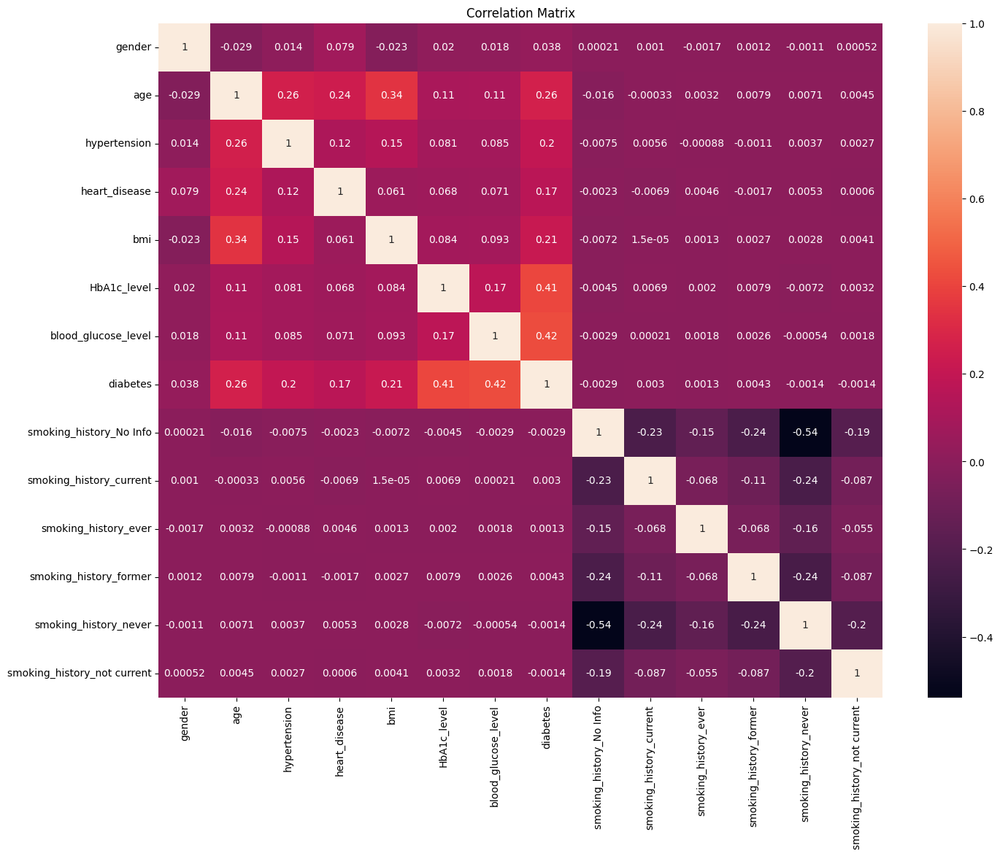

In [28]:
Corr_map = X.corr()
plt.figure(figsize=(16,12))
sns.heatmap(Corr_map, annot=True, cmap='rocket')
plt.title('Correlation Matrix')
plt.show()

In [29]:
from sklearn.utils import resample
df['gender'] = label_encoder.fit_transform(df['gender'])
df['smoking_history'] = label_encoder.fit_transform(df['smoking_history'])

x = df.drop(columns = ['diabetes', 'category']).values
y = df['diabetes'].values
from sklearn.model_selection import train_test_split


In [30]:
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.30, random_state=42)

In [43]:
train_data = pd.concat([pd.DataFrame(x_train, columns = df.drop(columns = ['diabetes', 'category']).columns), pd.Series(y_train, name = 'target')],
                       axis = 1)
majority_class = train_data[train_data['target'] == 0]
minority_class = train_data[train_data['target'] == 1]

# Upsample the minority class
minority_upsampled = resample(minority_class, replace = True, n_samples = len(majority_class), random_state = 42)

# Combine majority class with upsampled minority class
balanced_data = pd.concat([majority_class, minority_upsampled])
print(balanced_data)
# Separate features and target variable for the balanced dataset
X_balanced = balanced_data.drop('target', axis = 1)
y_balanced = balanced_data['target']
print(X_balanced)

balanced_data.to_csv('Balanced.csv')

       gender   age  hypertension  heart_disease  smoking_history    bmi  \
0         1.0  43.0           0.0            0.0              0.0  27.32   
1         1.0  47.0           0.0            0.0              4.0  24.90   
3         0.0  21.0           0.0            0.0              0.0  29.26   
4         0.0  59.0           0.0            0.0              3.0  30.93   
6         0.0  37.0           0.0            0.0              4.0  25.53   
...       ...   ...           ...            ...              ...    ...   
33686     1.0  66.0           0.0            0.0              3.0  28.33   
64639     0.0  80.0           0.0            0.0              4.0  27.32   
20551     1.0  55.0           0.0            1.0              2.0  30.83   
40639     1.0  80.0           0.0            0.0              4.0  26.95   
7477      0.0  80.0           0.0            1.0              4.0  19.99   

       HbA1c_level  blood_glucose_level  target  
0              6.5                100

## Decision Tree

In [32]:
from sklearn.ensemble import RandomForestClassifier

In [33]:
rfc = RandomForestClassifier(n_estimators=200)

In [34]:
rfc.fit(X_balanced,y_balanced)

RandomForestClassifier(n_estimators=200)

In [35]:
predictions = rfc.predict(x_test)

C:\Users\ryan_\.conda\envs\Streamlit\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



In [36]:
from sklearn.metrics import classification_report,confusion_matrix

In [37]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     26266
           1       0.85      0.70      0.77      2573

    accuracy                           0.96     28839
   macro avg       0.91      0.84      0.87     28839
weighted avg       0.96      0.96      0.96     28839



In [38]:
print(confusion_matrix(y_test,predictions))

[[25941   325]
 [  773  1800]]


# Web Application

In [39]:
import streamlit as st
from PIL import Image

st.write(""" #Screening Application for Diabetes""")

image = Image.open('c:/Users/ryan_/Downloads/diabetes-528678_640.jpg')
st.image(image, use_column_width=True)

2024-02-01 02:42:46.568 
  command:

    streamlit run C:\Users\ryan_\.conda\envs\Streamlit\Lib\site-packages\ipykernel_launcher.py [ARGUMENTS]


DeltaGenerator()

In [40]:
def get_user_input():
    gender = st.sidebar.slider('Sex', )
    age = st.sidebar.slider('Your Age', )
    

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96128 entries, 0 to 99999
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   gender               96128 non-null  int32  
 1   age                  96128 non-null  float64
 2   hypertension         96128 non-null  int64  
 3   heart_disease        96128 non-null  int64  
 4   smoking_history      96128 non-null  int32  
 5   bmi                  96128 non-null  float64
 6   HbA1c_level          96128 non-null  float64
 7   blood_glucose_level  96128 non-null  int64  
 8   diabetes             96128 non-null  int64  
 9   category             96128 non-null  object 
dtypes: float64(3), int32(2), int64(4), object(1)
memory usage: 9.3+ MB
